# Predict Click-Through-Rate (Local Machine)


## Problem to be solved:
The project is to predict whether a mobile ad will be clicked or not. Click-Through-Rate (CTR) metric is used for evaluating ad performance and CTR systems are widely used by internet economy. The problem and solutions are applicable to current internet economy. The problem provides quite a good learning opportunity with a typical setup in real word with lots of data and lots of features.

## Project Client:
The project is a completed [Kaggle Competetion](https://www.kaggle.com/c/avazu-ctr-prediction). There is already a solution available for the project and reward has been awarded to the winning team.

The project client is myself to see if I am able to apply advanced Machine Learning technologies and Data Science methodologies learned in this workshop to arrive to a solution that would match up to the top teams in the competition. Since the solution is available, there is a certainty to solution that one should arrive. 
As mentioned before, the main aim here is to apply learning of this course to a real life problem to 1) refine the learnings further 2) demonstrate the learnings  and 3) be ready to apply the learnings to next projects.

## Data Set:
The data-set is available [here](https://www.kaggle.com/c/avazu-ctr-prediction/data). The data-set contains training and test data. The data-set is in csv format. The zipped training data, is about 1 Gb in size and test data-set is about 118 Mb. The data-set is well defined with some of the categorical features anonymized.

## Data Fields:
* id: ad identifier
* click: 0/1 for non-click/click
* hour: format is YYMMDDHH, so 14091123 means 23:00 on Sept. 11, 2014 UTC.
* C1 -- anonymized categorical variable
* banner_pos
* site_id
* site_domain
* site_category
* app_id
* app_domain
* app_category
* device_id
* device_ip
* device_model
* device_type
* device_conn_type
* C14-C21 -- anonymized categorical variables

## Anonymized Categorical Variables:
Most of the fields are self-explanatory around mobile ad being clicked or not. However, there are anonymized categorical variables. It would have been good to get an idea about these variables. Not knowing the name or significance of these fields, any data engineering could not be applied to these fields and they have to be taken as they are given.

## Data Story:
Please see [here](../../data_story/data_story.html) for the data exploration of the data-set for this project. The followings are the main points from the data story.

1.	From the data-set, the Click-Through-Rate is about 16.98%. The Click-Through-Rate is successfully clicked ad from the total data-set. As explained in the field, when Click value is greater than zero, an ad is clicked.
2.	The training data-set contains about 40+ million entries with 22 features affecting the prediction.
3.	With the large number of entries, only about 17% data is classified as positive class and remaining are in negative class. The negative class values are about 5 times more than positive class value. The data-set presents Class imbalance problem.
4.	With various exploration, at times it seems that day and time may not have much impact. However, the volume of data on a particular day may have an impact. It would be hard to tell if there is a real impact or not without running through various models.
5.	As discussed above, all features shall be considered for the modelling purpose.

## Code for Predicting The Click-Through-Rate:
The coding for predicting the click-through-rate starts below.

### Load Required Packages:

In [9]:
# First thing first - bring necessary modules in
%matplotlib inline
import sklearn
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
# a utility project level module for
# loading samples and plotting data
import project_utils as pu
# a utility project level module
# for classification
import model_utils as mu
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")
import datetime as dt
import os
import importlib
importlib.reload(pu)

<module 'project_utils' from 'c:\\Users\\amees\\Documents\\my_work\\data_science_workshop\\capstone_project\\project\\project_utils.py'>

### Load Samples

In [11]:
def pos_neg_ratio(df):
    num_pos = df[df.click > 0].count()[0]
    num_neg = df[df.click == 0].count()[0]
    return ((num_pos / num_neg), num_pos, num_neg)

In [12]:
# Load sample with 50-50 (pos-neg) balance
df_50 = pu.sample_data(num_samples_per_bin=100, frac_pos=0.5)

In [13]:
# Load sample with 33-66 (pos-neg) balance
df_33 = pu.sample_data(num_samples_per_bin=100, frac_pos=0.33)

In [14]:
# Load sample with 20-80 (pos-neg) balance
df_20 = pu.sample_data(num_samples_per_bin=100, frac_pos=0.2)

In [15]:
print(pos_neg_ratio(df_50))
print(pos_neg_ratio(df_33))
print(pos_neg_ratio(df_20))

(1.0, 40429, 40429)
(0.49255191508998614, 26684, 54175)
(0.25000386476417208, 16172, 64687)


In [16]:
# look at the columns available in data-set
df_50.columns

Index(['id', 'click', 'hour', 'C1', 'banner_pos', 'site_id', 'site_domain',
       'site_category', 'app_id', 'app_domain', 'app_category', 'device_id',
       'device_ip', 'device_model', 'device_type', 'device_conn_type', 'C14',
       'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21'],
      dtype='object')

In [17]:
# columns for X value (click and id are ignored)
print(len(pu.x_columns))
pu.x_columns

22


['hour',
 'C1',
 'banner_pos',
 'site_id',
 'site_domain',
 'site_category',
 'app_id',
 'app_domain',
 'app_category',
 'device_id',
 'device_ip',
 'device_model',
 'device_type',
 'device_conn_type',
 'C14',
 'C15',
 'C16',
 'C17',
 'C18',
 'C19',
 'C20',
 'C21']

In [18]:
# Workout X and y for different samples
X50 = df_50[pu.x_columns].values
y50 = (df_50.click > 0).values
X33 = df_33[pu.x_columns].values
y33 = (df_33.click > 0).values
X20 = df_20[pu.x_columns].values
y20 = (df_20.click > 0).values

### Logistic Regression

Let's apply logistic regression on 50-50 balanced data-set and see the results.

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


# Split the data into a training and test set.
Xlr, Xtestlr, ylr, ytestlr = train_test_split(df_50[pu.x_columns].values, 
                                              (df_50.click > 0).values, random_state=5)

clf = LogisticRegression()
# Fit the model on the trainng data.
clf.fit(Xlr, ylr)
# Print the accuracy from the testing data.
print(accuracy_score(clf.predict(Xtestlr), ytestlr))

0.549394014346


The simple logistic regression produces 55% accuracy.

### Logistic Regression with KFold = 5

In [20]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

def cv_score(clf, x, y, score_func=accuracy_score):
    result = 0
    nfold = 5
    for train, test in KFold(nfold).split(x): # split data into train/test groups, 5 times
        clf.fit(x[train], y[train]) # fit
        result += score_func(clf.predict(x[test]), y[test]) # evaluate score function on held-out data
    return result / nfold # average

In [21]:
clf_lr_50 = LogisticRegression()
score = cv_score(clf_lr_50, Xlr, ylr)
print(score)

0.550632404325


The KFlold approach improves the accuracy a bit - by not much.

### Logistic Regression - Find Best C value

Carry out the same exercise as above with different C values. See which C value produces the best result.

In [71]:
import operator
def _cv_score(clf, x, y, score_func=accuracy_score):
    result = 0
    nfold = 5
    for train, test in KFold(nfold).split(x): # split data into train/test groups, 5 times
        clf.fit(x, y) # fit
        result += score_func(clf.predict(x), y) # evaluate score function
    return result / nfold # average


#the grid of parameters to search over
Cs = [0.001, 0.1, 1, 10, 100]
Cs_score = []
for _c in Cs:
    clf = LogisticRegression(C=_c)
    score = _cv_score(clf, Xlr, ylr)
    Cs_score.append(score)
    print ('C: %f, score: %f' % (_c, score))

max_index, max_c = max(enumerate(Cs_score), key=operator.itemgetter(1))
print (Cs[max_index], max_c)

C: 0.001000, score: 0.544003
C: 0.100000, score: 0.555349
C: 1.000000, score: 0.548406
C: 10.000000, score: 0.543822
C: 100.000000, score: 0.544003
0.1 0.55534851508


In [72]:
# Look at the performance of classifier on training-set data.
clf_lr_50 = LogisticRegression(C=Cs[max_index])
score = cv_score(clf_lr_50, Xlr, ylr)
print("Accuracy Score: %f" % score)
print("Accuracy Score Tests: %f" % accuracy_score(clf_lr_50.predict(Xtestlr), ytestlr))

Accuracy Score: 0.544119
Accuracy Score Tests: 0.547267


The actual perfornace on training data is slightly less than KFold average. This could happen as big sample of mix of various data compare to smaller sample in KFold.

### Logistic Regression with GridSearch

Now, let's try GridSearch function available from sklearn. This should do similar to what we did with KFold approach above.

In [73]:
import sklearn
from sklearn.model_selection import GridSearchCV
clf = LogisticRegression()
gs = GridSearchCV(clf, param_grid={"C" : Cs}, cv=5)
gs.fit(Xlr, ylr)
# Print the accuracy from the testing data.
print("Accuracy Score Tests: %f" % accuracy_score(gs.predict(Xtestlr), ytestlr))

Accuracy Score Tests: 0.549295


OK, so GridSearch produces very similar result. Now, let's scale the solution. There is a do_classify routine available in moodel_utils package of this project. This routine takes data frame, classifier and different parameters and finds the best parameter for the classifier for the given training data set. Using this function, different data sets could be tried out on different classifier and the best performing classifier could be selected.

For this project, LogisticRegression, SVM and RandomForest classifier will be used. These classifiers will be trained with 50-50 balanced sample, 33-66 ratio sample and 20-80 ration sample. The reason behind these ratios is that for imbalance classifier problem the sample should be balanced. Hence 50-50 balanced sample makes sense. 20-80 ration is very near to the actual classification ratio and 33-55 ration sits somewhere in middle from 50-50 balanced sample to actual ratio.

With three classifiers and three data-set, we will have total nine classifiers to choose from. Also, each and every classifier will be tried for different parameters. If each classifier is tried for four different parameters, essentially, the best classifier would be selected from 36 classifiers.

According to theory, 50-50 balanced ratio sample with Random Forest Classifier shall perform the best. 

### Logistic Regression with do_classify

In [18]:
clf_lr_50, Xtrain_lr_50, ytrain_lr_50, Xtest_lr_50, ytest_lr_50  = mu.do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_50, pu.x_columns, 'click', 0)

BEST PARAMS {'C': 0.1}
Accuracy on training data: 0.55
Accuracy on test data:     0.55


In [19]:
clf_lr_33, Xtrain_lr_33, ytrain_lr_33, Xtest_lr_33, ytest_lr_33  = mu.do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_33, pu.x_columns, 'click', 0)

BEST PARAMS {'C': 0.01}
Accuracy on training data: 0.67
Accuracy on test data:     0.67


In [20]:
clf_lr_20, Xtrain_lr_20, ytrain_lr_20, Xtest_lr_20, ytest_lr_20  = mu.do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_20, pu.x_columns, 'click', 0)

BEST PARAMS {'C': 0.01}
Accuracy on training data: 0.80
Accuracy on test data:     0.80


#### Analysis of Accuracy Score:
From the above result it seems that the classifier seems to be doing better as class ratio becomes more imbalance. That might be because classifier might be over fitting it. The same classifier may not be good enough with other data.
Also, it is not good enough to look at accuracy score. It is time to look at other perofrmance matrices.

In [21]:
# Look at the confusion matrix for different classifier with differen data sets.
from sklearn.metrics import confusion_matrix
print(confusion_matrix(ytest_lr_50, clf_lr_50.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_33, clf_lr_33.predict(Xtest_lr_33)))
print(confusion_matrix(ytest_lr_20, clf_lr_20.predict(Xtest_lr_20)))
print(confusion_matrix(ytest_lr_50, clf_lr_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_50, clf_lr_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytestlr, clf_lr_20.predict(Xtestlr)))
print(confusion_matrix(ylr, clf_lr_20.predict(Xlr)))

[[3643 4392]
 [2917 5220]]
[[10774    16]
 [ 5376     6]]
[[12929     0]
 [ 3243     0]]
[[8035    0]
 [8137    0]]
[[8035    0]
 [8137    0]]
[[10084     0]
 [10131     0]]
[[30345     0]
 [30298     0]]


#### Analysis of Confusion Matrix:
The confusion matrix gives a good idea that it is not all well with classifier trained with imbalanced data-set. The prediction has very high rate of False Positive.

#### Plotting of Data:
This scenario would be easy to understand if we plot the data. Let's perform PCA transformation with two components and see 1) Actual Data 2) Predicted data and how they match.

For this purpose, there is a routine called plot_distribution available in project_utils module. Xtestlr and ytestlr has been derived from 50-50 sample when LogisticRegression was tried for the first time.

##### Plotting LR + 50-50 Training Data:

In [86]:
print(confusion_matrix(ytestlr, clf_lr_50.predict(Xtestlr)))

[[5032 5052]
 [4100 6031]]


In [ ]:
# <a id='lr_50_test_actual'></a>

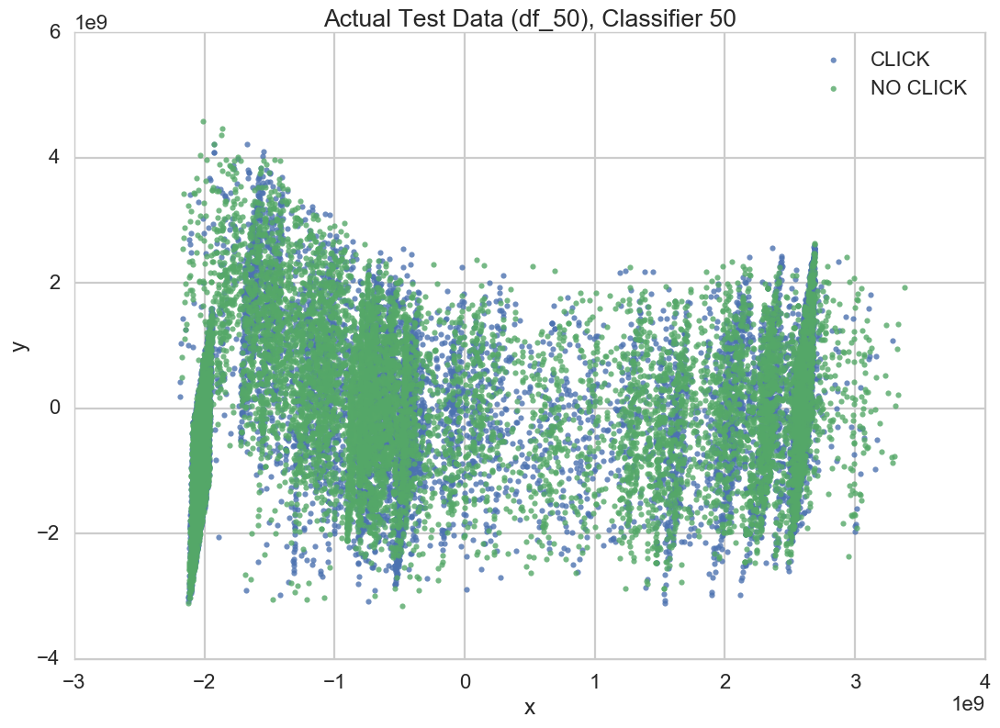

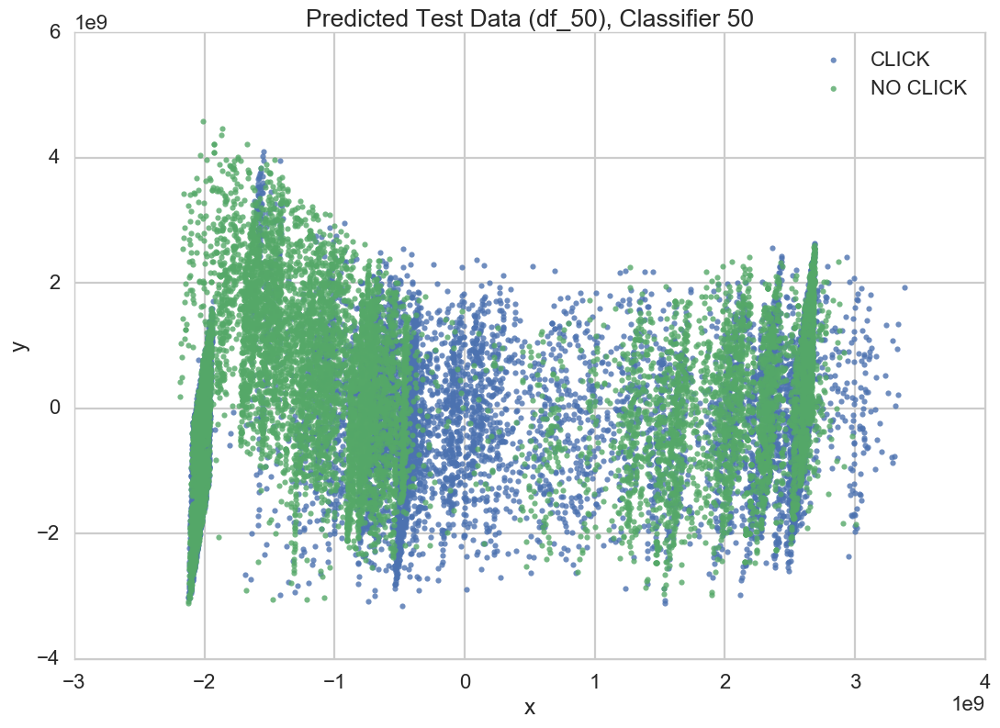

In [22]:
from IPython.display import display, HTML

display(HTML('<a id="lr_50_test_actual"></a>'))
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_50, predicted=False, title="Actual Test Data (df_50), Classifier 50")
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_50, predicted=True, title="Predicted Test Data (df_50), Classifier 50")

##### Analysis of plots:
From the above plot it can be seen that there this classifier may reasonable accuracy score but shows big miss classification on test data.

##### Plotting LR + 33-66 Training Data:

In [87]:
print(confusion_matrix(ytestlr, clf_lr_33.predict(Xtestlr)))

[[10073    11]
 [10115    16]]


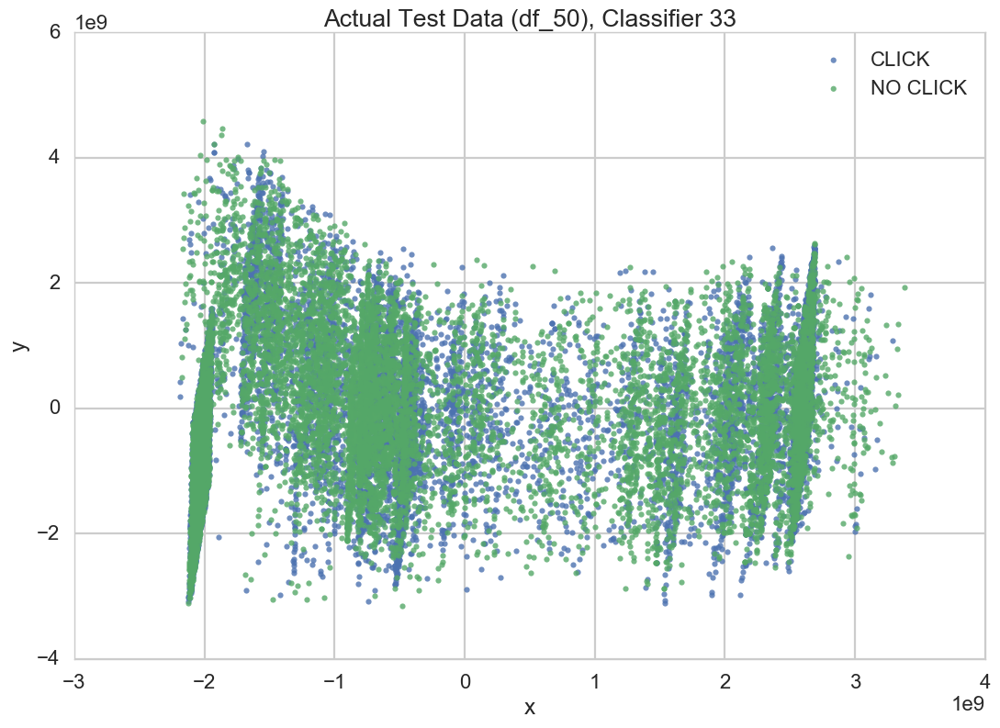

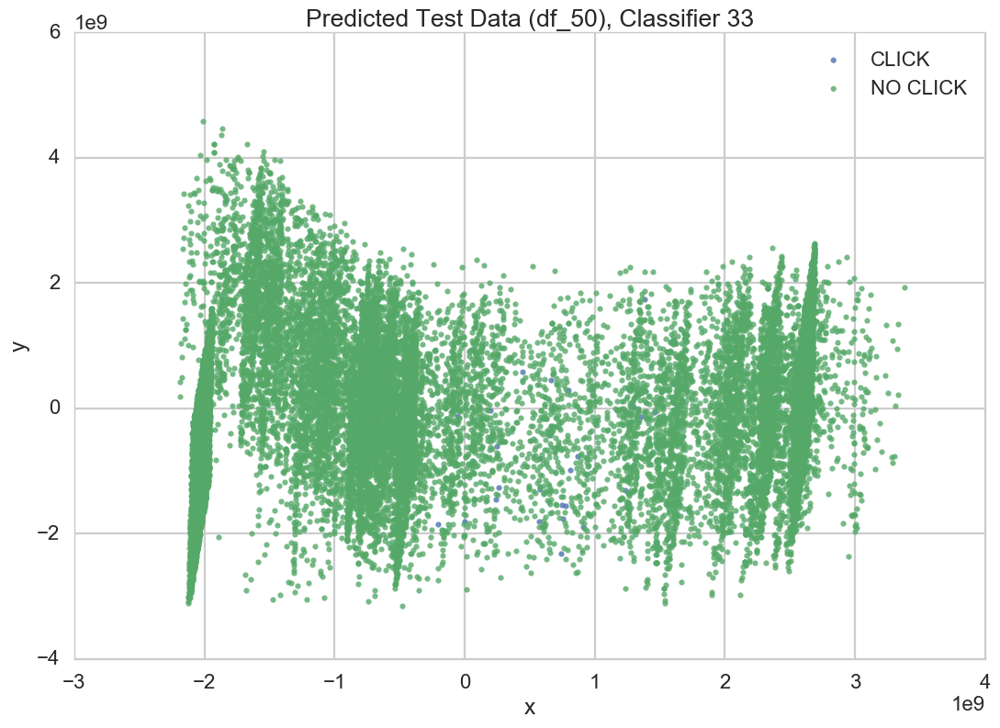

In [23]:
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_33, predicted=False, title="Actual Test Data (df_50), Classifier 33")
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_33, predicted=True,  title="Predicted Test Data (df_50), Classifier 33")

##### Analysis of plots:
From the above plot it can be seen that there are lots of False Positive with this classifier.

##### Plotting LR + 20-80 Training Data:

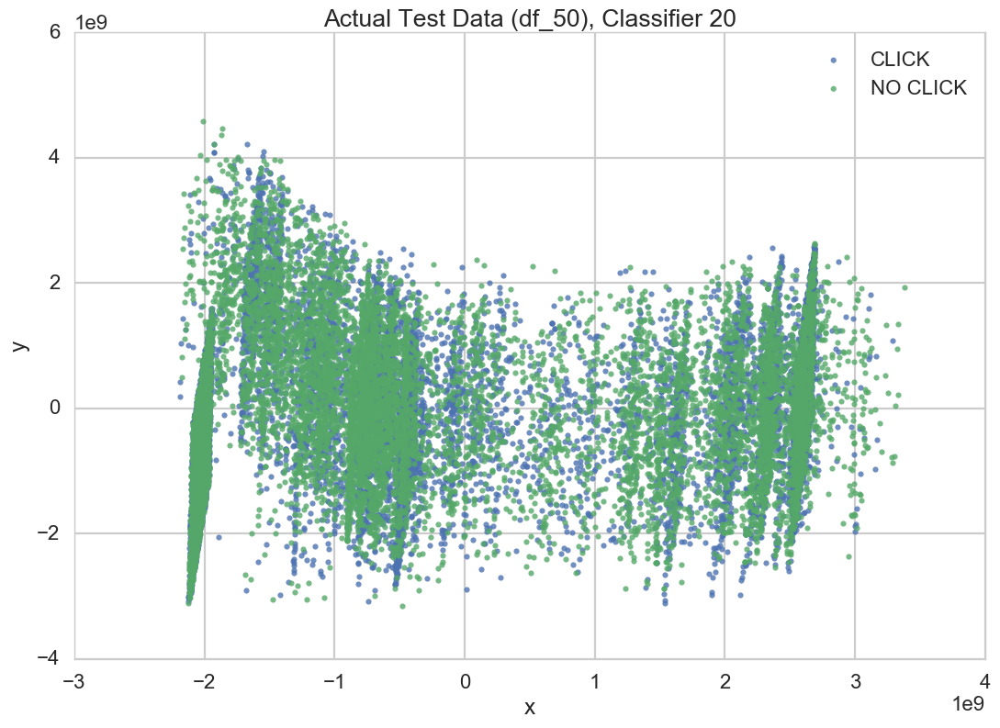

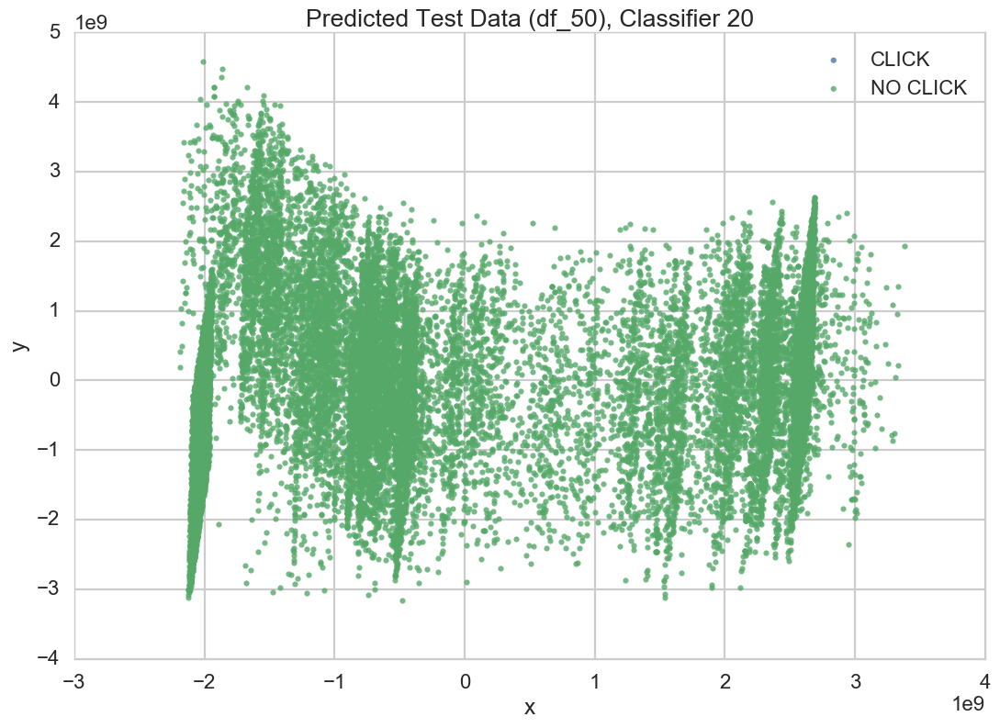

In [24]:
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_20, predicted=False,  title="Actual Test Data (df_50), Classifier 20")
pu.plot_distribution(Xtestlr, ytestlr, clf_lr_20, predicted=True,  title="Predicted Test Data (df_50), Classifier 20")

##### Analysis of plots:
As confusion matrix shows this classifier suffers the same issue off False Positive.

### SVM Classifier
According to plan, next one in queue is SVM classifier. However, SVM classifier took quite long to run. SGDClassifier with loss parameter set to hinge behaves as Linear SVM.

In [25]:
# from sklearn import svm
# svm.SVC(kernel='linear')

In [26]:
from sklearn import svm
#from sklearn.linear_model import SGDClassifier
# clf_svm_50, Xtrain_svm_50, ytrain_svm_50, Xtest_svm_50, ytest_svm_50  = mu.do_classify(svm.SVC(kernel='linear'), 
#                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
#                                                           df_50, pu.x_columns, 'click', 0)

In [27]:
# clf = svm.SVC(kernel='linear', C=0.01)
# clf.fit(Xlr, ylr)

### SGD Classifier with do_classify

Three SGD classifier with different imbalanced data-set will be trained for different value of alpha. do_classify will return the classifier with the best alpha parameter. These three classifier will be tested for their prediction, accuracy score and confusion matrix. Also, distribution plot of actual and predicted data shall show the performance of the classifier.  

In [28]:
from sklearn.linear_model import SGDClassifier
clf_sgd_50, Xtrain_sgd_50, ytrain_sgd_50, Xtest_sgd_50, ytest_sgd_50  = mu.do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_50, pu.x_columns, 'click', 0)

BEST PARAMS {'alpha': 10}
Accuracy on training data: 0.50
Accuracy on test data:     0.50


In [29]:
clf_sgd_33, Xtrain_sgd_33, ytrain_sgd_33, Xtest_sgd_33, ytest_sgd_33  = mu.do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_33, pu.x_columns, 'click', 0)

BEST PARAMS {'alpha': 10}
Accuracy on training data: 0.67
Accuracy on test data:     0.67


In [30]:
clf_sgd_20, Xtrain_sgd_20, ytrain_sgd_20, Xtest_sgd_20, ytest_sgd_20  = mu.do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_20, pu.x_columns, 'click', 0)

BEST PARAMS {'alpha': 0.1}
Accuracy on training data: 0.80
Accuracy on test data:     0.80


#### Confusion Matrix SGD Classifier: 

In [34]:
print(confusion_matrix(ytest_lr_50, clf_sgd_50.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_33, clf_sgd_33.predict(Xtest_lr_33)))
print(confusion_matrix(ytest_lr_20, clf_sgd_20.predict(Xtest_lr_20)))
print(confusion_matrix(ytest_lr_50, clf_sgd_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_50, clf_sgd_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytestlr, clf_sgd_20.predict(Xtestlr)))
print(confusion_matrix(ylr, clf_sgd_20.predict(Xlr)))

[[2879 5156]
 [2979 5158]]
[[10689   101]
 [ 5328    54]]
[[12928     1]
 [ 3243     0]]
[[8035    0]
 [8137    0]]
[[8035    0]
 [8137    0]]
[[10082     2]
 [10131     0]]
[[30343     2]
 [30297     1]]


The confusion matrix shows that classifiers other than 50-50 balanced sample classifier suffer from issue of very high False Positive.

#### Plotting Dta SGD Classifier:

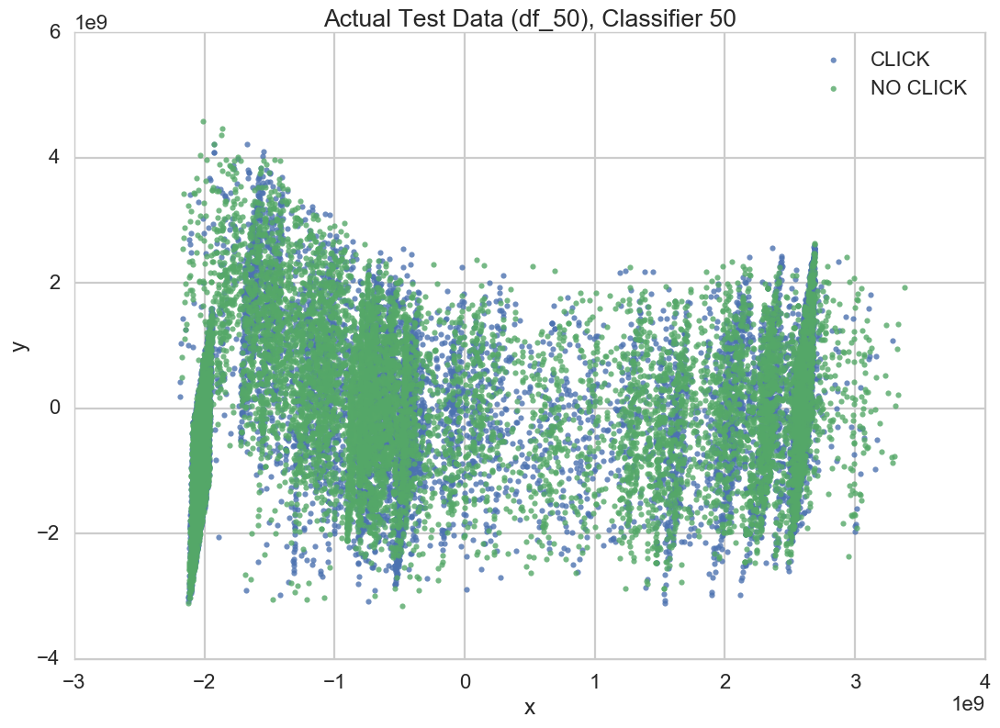

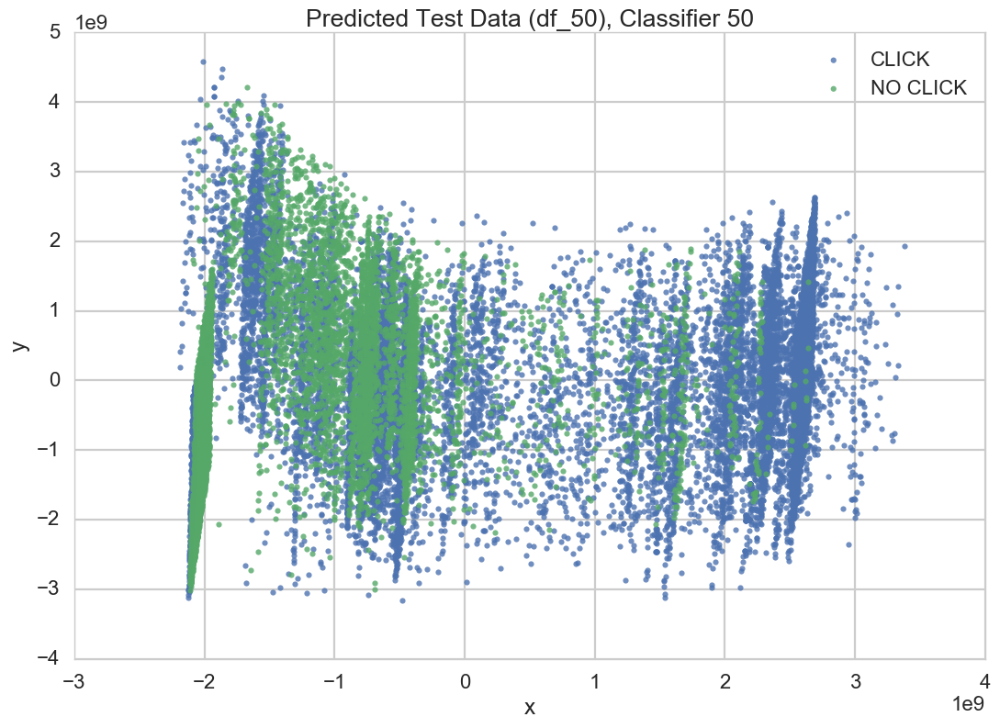

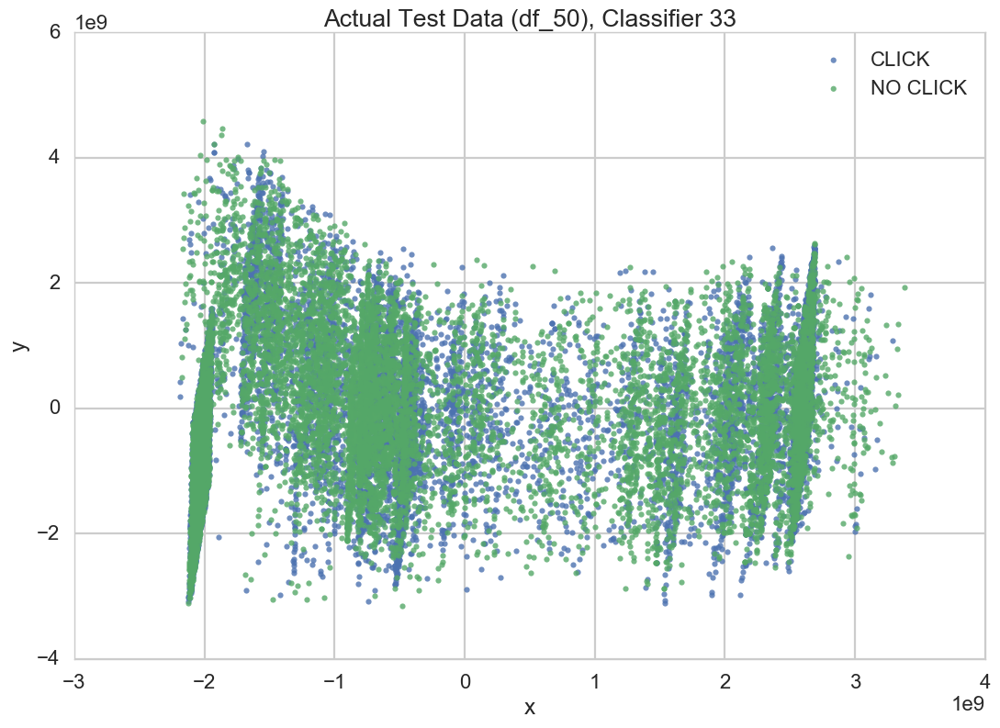

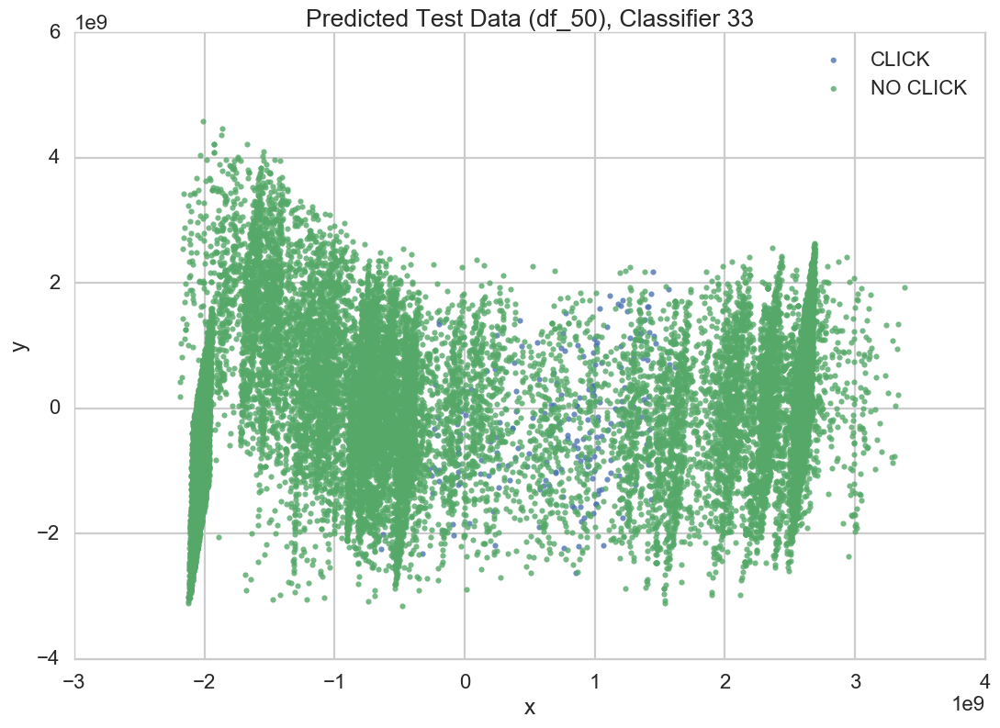

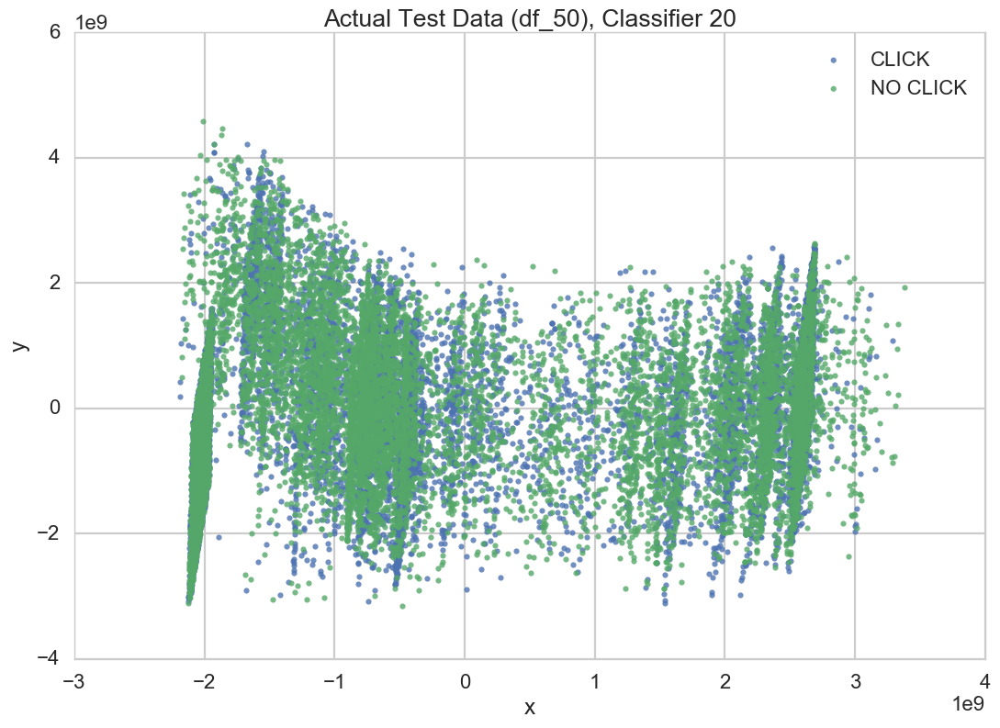

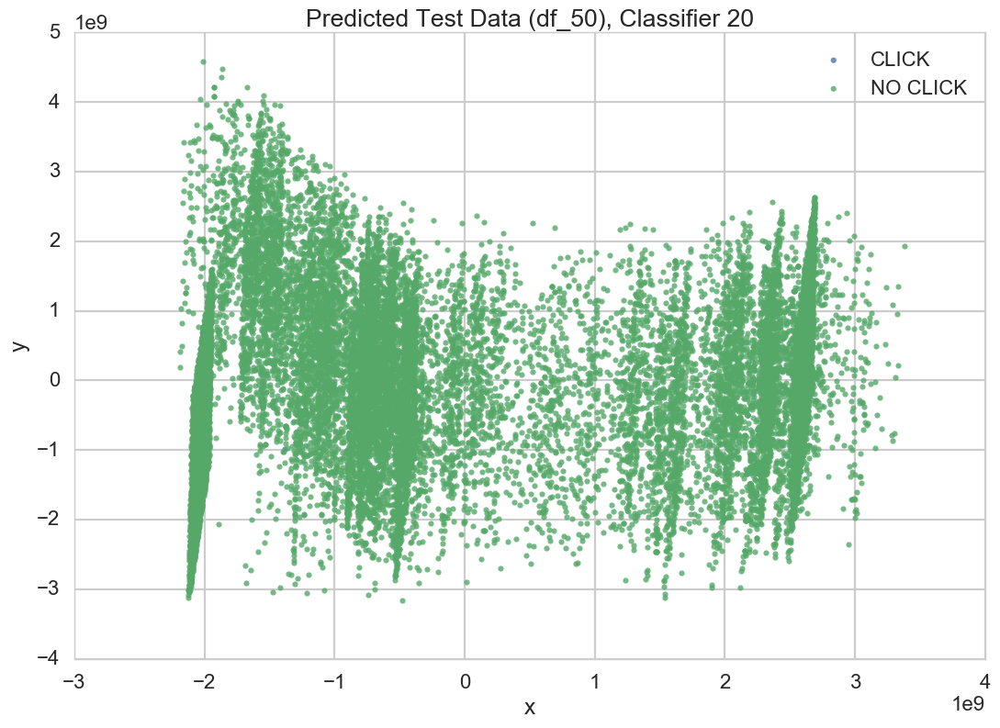

In [94]:
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_50, predicted=False, title="Actual Test Data (df_50), Classifier 50")
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_50, predicted=True, title="Predicted Test Data (df_50), Classifier 50")
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_33, predicted=False, title="Actual Test Data (df_50), Classifier 33")
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_33, predicted=True, title="Predicted Test Data (df_50), Classifier 33")
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_20, predicted=False, title="Actual Test Data (df_50), Classifier 20")
pu.plot_distribution(Xtestlr, ytestlr, clf_sgd_20, predicted=True, title="Predicted Test Data (df_50), Classifier 20")

##### Analysis of plots:

The plots show that classifiers other than 50-50 balanced sample classifier suffer from issue of very high False Positive. SGD Classifier trained with 50-50 balanced sample has lots of miss prediction.

### Random Forest Classifier with do_classify

As seen before for LinearRegression and SGDClassifier, Radom Forest Classifier with three different imbalanced samples will be trained for different estimators. These three classifier will be tested against different data-set and the best perforing classifier will be tried with **TEST** data supplied with the challange.

OOB parameter is set to true to use OOB Error data-set as testing data.

It is expected that Random Forest Classifier with 50-50 balanced sample should perform the best.

In [35]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=120, oob_score=True)
rfc.fit(Xlr, ylr)
print(accuracy_score(rfc.predict(Xtestlr), ytestlr))

0.637843185753


In [36]:
clf_rfc_50, Xtrain_rfc_50, ytrain_rfc_50, Xtest_rfc_50, ytest_rfc_50  = mu.do_classify(
                                                           RandomForestClassifier(oob_score=True), 
                                                           {"n_estimators": [50, 80, 100, 120, 140]}, 
                                                           df_50, pu.x_columns, 'click', 0)

BEST PARAMS {'n_estimators': 100}
Accuracy on training data: 1.00
Accuracy on test data:     0.63


In [42]:
clf_rfc_33, Xtrain_rfc_33, ytrain_rfc_33, Xtest_rfc_33, ytest_rfc_33  = mu.do_classify(
                                        RandomForestClassifier(min_weight_fraction_leaf=0.33, oob_score=True), 
                                        {"n_estimators": [50, 80, 100, 120]}, 
                                        df_33, pu.x_columns, 'click', 0)


BEST PARAMS {'n_estimators': 50}
Accuracy on training data: 0.67
Accuracy on test data:     0.67


In [45]:
clf_rfc_20, Xtrain_rfc_20, ytrain_rfc_20, Xtest_rfc_20, ytest_rfc_20  = mu.do_classify(
                                        RandomForestClassifier(min_weight_fraction_leaf=0.2, oob_score=True), 
                                        {"n_estimators": [50, 80, 100, 120]}, 
                                        df_20, pu.x_columns, 'click', 0)

BEST PARAMS {'n_estimators': 50}
Accuracy on training data: 0.80
Accuracy on test data:     0.80


#### Accury Score for RandomForest Classifiers:

In [92]:
print(accuracy_score(clf_rfc_50.predict(X50), y50))
print(accuracy_score(clf_rfc_50.predict(X33), y33))
print(accuracy_score(clf_rfc_50.predict(X20), y20))

0.924373593213
0.632829988004
0.631531431257


In [43]:
print(accuracy_score(clf_rfc_33.predict(X50), y50))
print(accuracy_score(clf_rfc_33.predict(X33), y33))
print(accuracy_score(clf_rfc_33.predict(X20), y20))

0.5
0.66999344538
0.799997526559


In [46]:
print(accuracy_score(clf_rfc_20.predict(X50), y50))
print(accuracy_score(clf_rfc_20.predict(X33), y33))
print(accuracy_score(clf_rfc_20.predict(X20), y20))

0.5
0.66999344538
0.799997526559


As seen from above results Random Forest Classifier with 50-50 balance sample seems to be performing consistently with data-sets used for training.

#### Consusion Matrix for RandomForest Classifiers:

In [93]:
print(confusion_matrix(y50, clf_rfc_50.predict(X50)))
print(confusion_matrix(y33, clf_rfc_50.predict(X33)))
print(confusion_matrix(y20, clf_rfc_50.predict(X20)))

[[37323  3106]
 [ 3009 37420]]
[[34056 20119]
 [ 9570 17114]]
[[40602 24085]
 [ 5709 10463]]


In [95]:
print(confusion_matrix(y50, clf_rfc_33.predict(X50)))
print(confusion_matrix(y33, clf_rfc_33.predict(X33)))
print(confusion_matrix(y20, clf_rfc_33.predict(X20)))

[[40429     0]
 [40429     0]]
[[54175     0]
 [26684     0]]
[[64687     0]
 [16172     0]]


In [96]:
print(confusion_matrix(y50, clf_rfc_20.predict(X50)))
print(confusion_matrix(y33, clf_rfc_20.predict(X33)))
print(confusion_matrix(y20, clf_rfc_20.predict(X20)))

[[40429     0]
 [40429     0]]
[[54175     0]
 [26684     0]]
[[64687     0]
 [16172     0]]


##### Analysis of the results:
As seen from above results Random Forest Classifiers other than 50-50 balance sample seem to be suffering from False Positive issue.

#### RandomForest Data Plot:
Since RandomForest with balanced sample seems to be performing consistently, various data sets will be plottted only for this particular classifier.

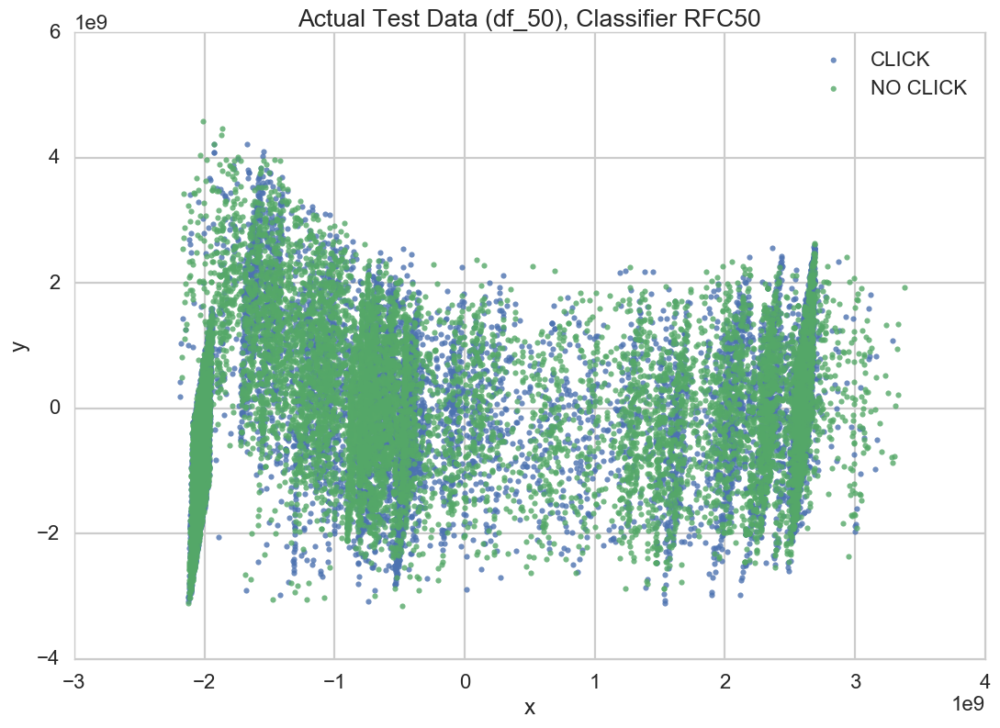

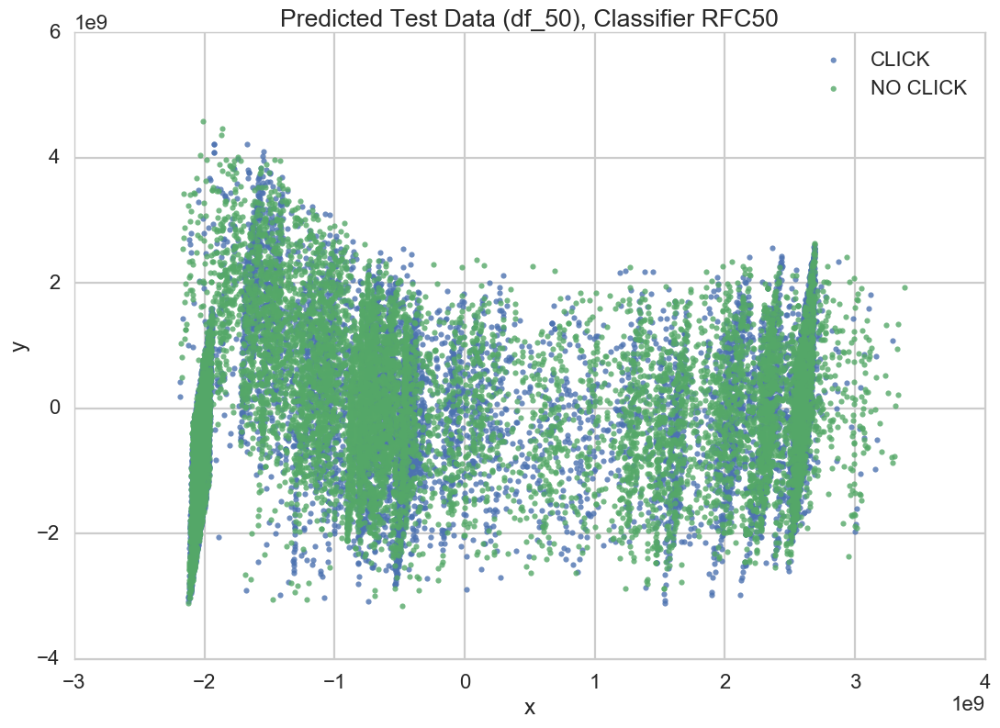

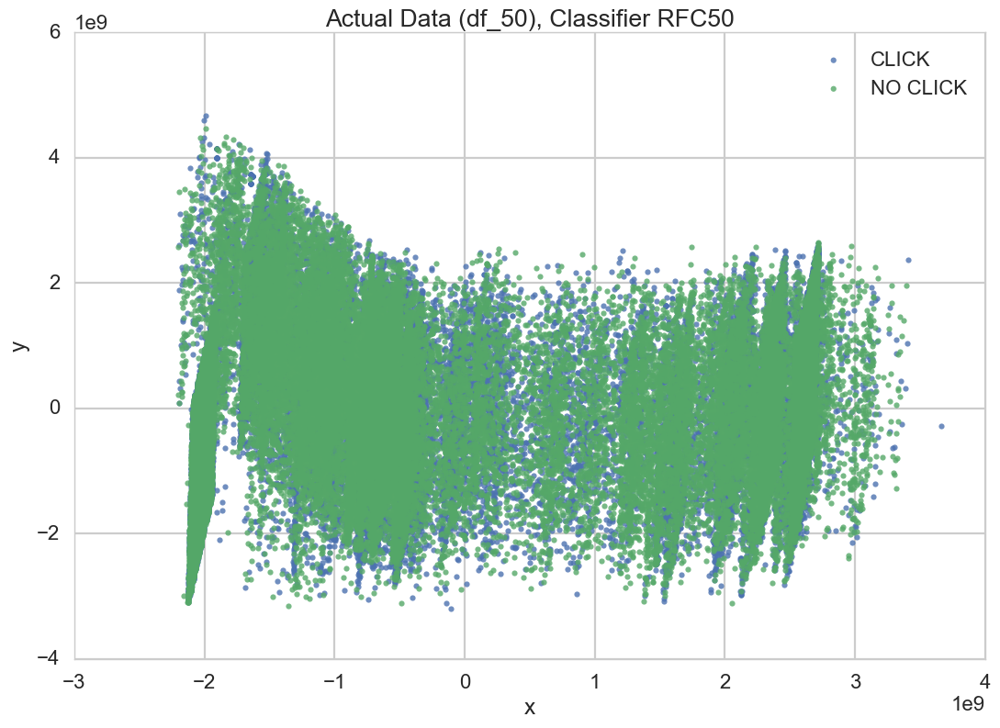

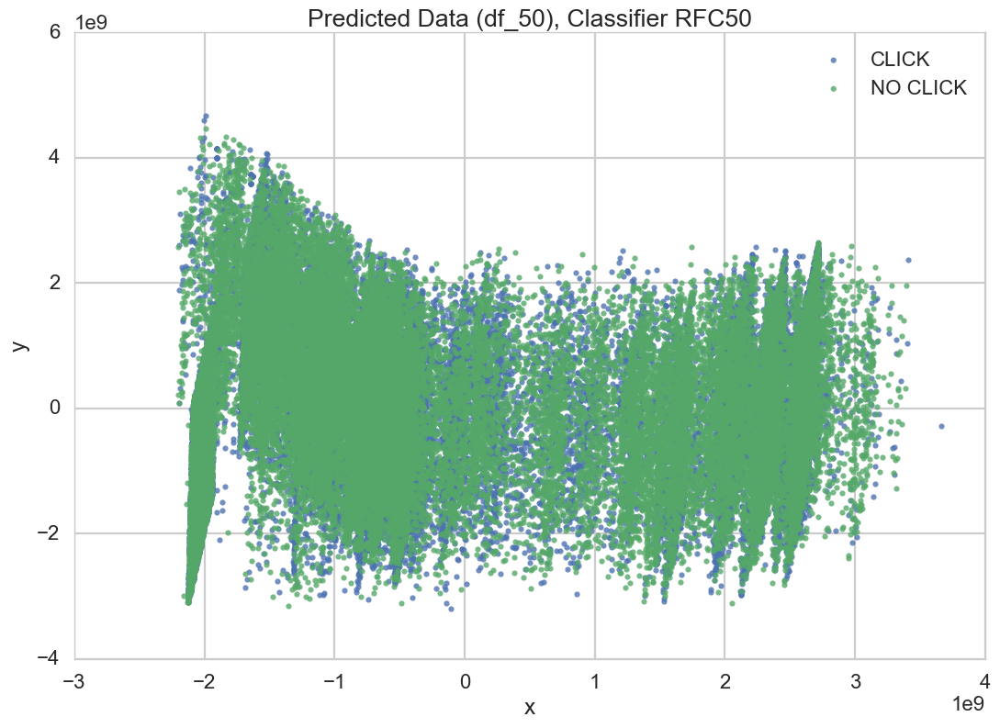

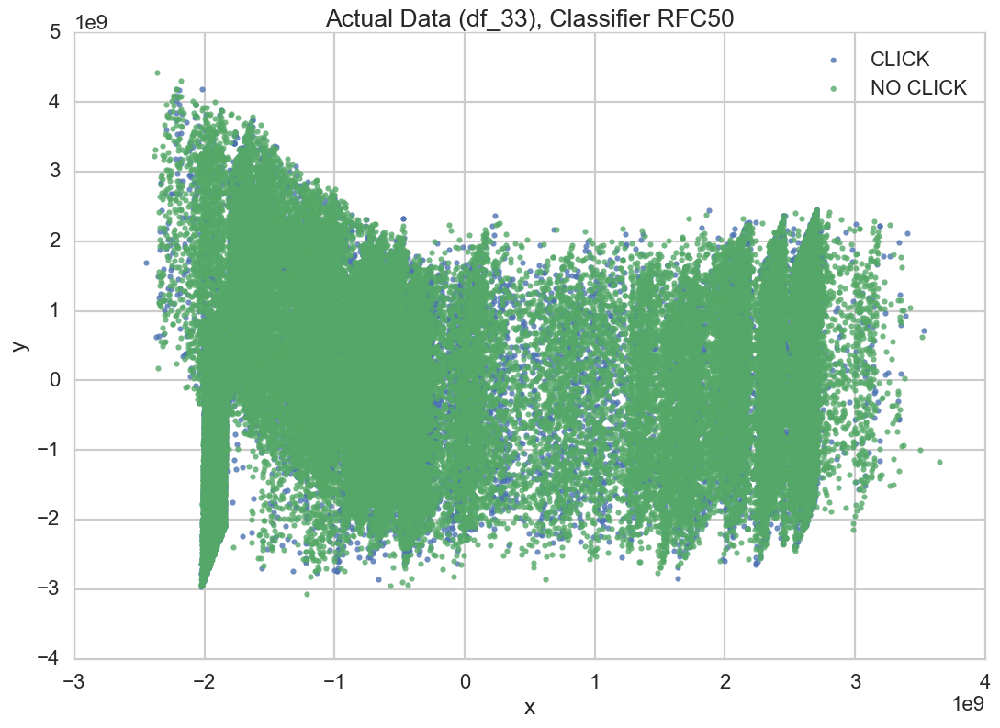

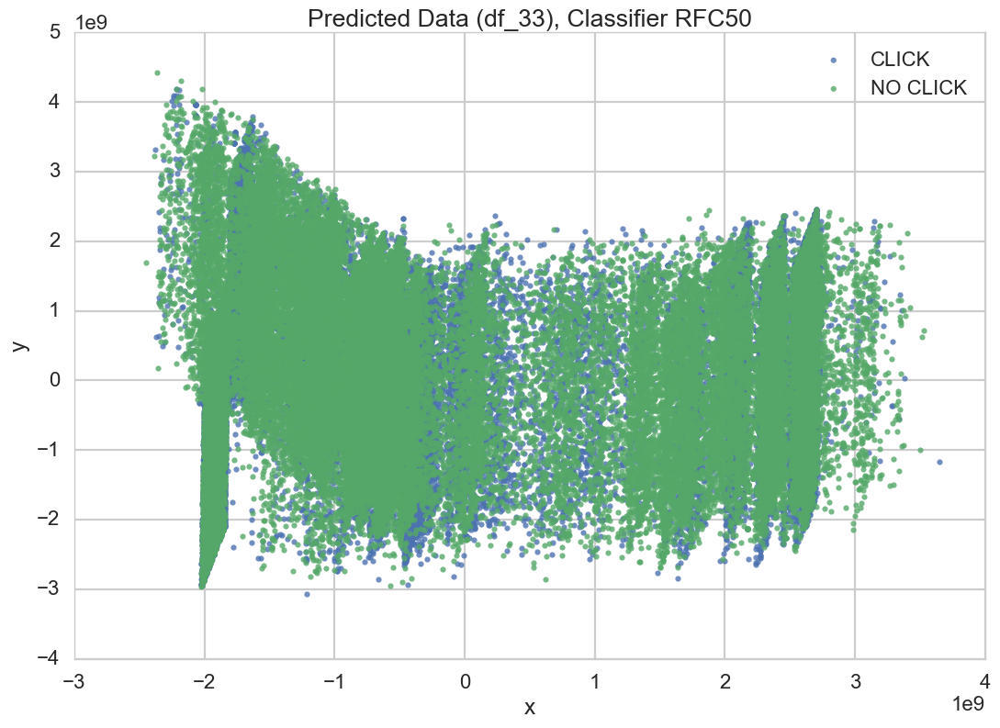

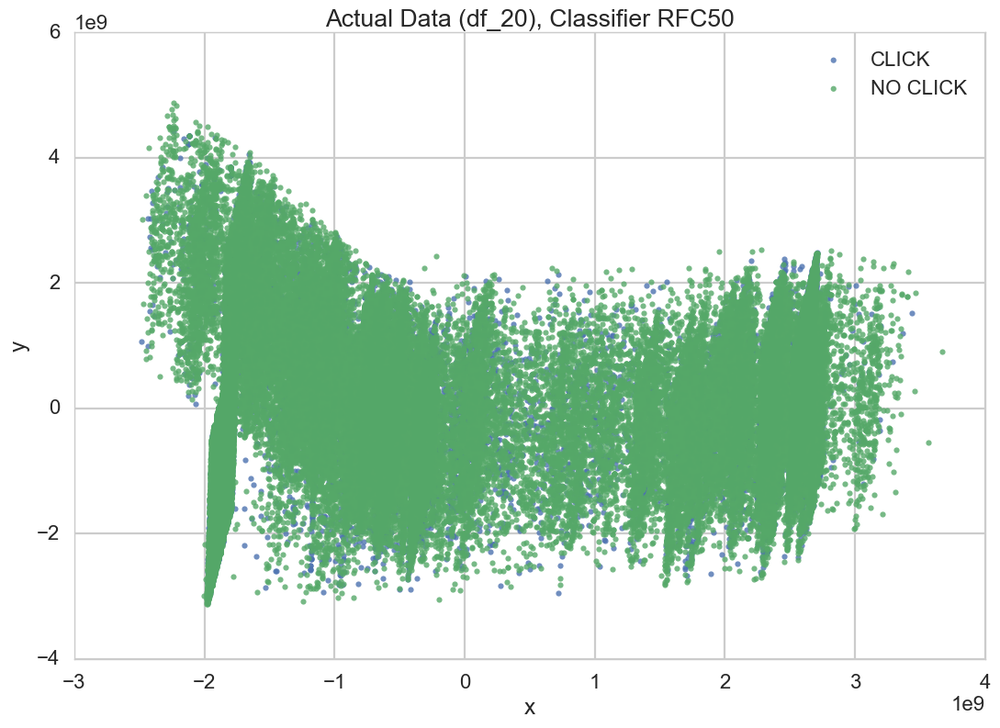

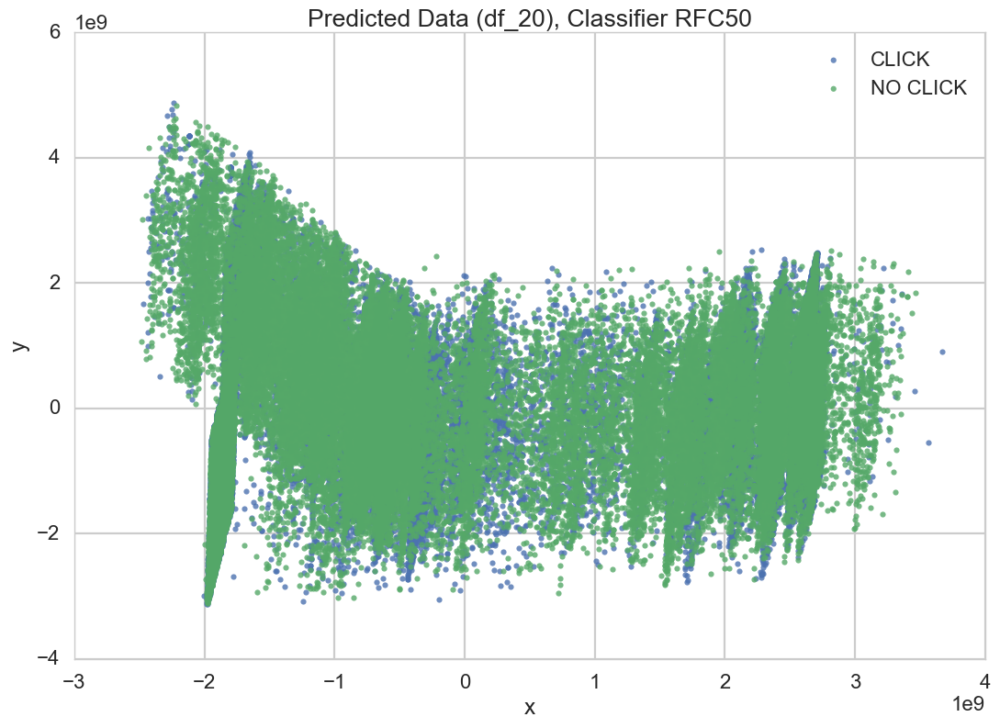

In [97]:
pu.plot_distribution(Xtestlr, ytestlr, clf_rfc_50, predicted=False, title="Actual Test Data (df_50), Classifier RFC50")
pu.plot_distribution(Xtestlr, ytestlr, clf_rfc_50, predicted=True, title="Predicted Test Data (df_50), Classifier RFC50")
pu.plot_distribution(X50, y50, clf_rfc_50, predicted=False, title="Actual Data (df_50), Classifier RFC50")
pu.plot_distribution(X50, y50, clf_rfc_50, predicted=True, title="Predicted Data (df_50), Classifier RFC50")
pu.plot_distribution(X33, y33, clf_rfc_50, predicted=False, title="Actual Data (df_33), Classifier RFC50")
pu.plot_distribution(X33, y33, clf_rfc_50, predicted=True, title="Predicted Data (df_33), Classifier RFC50")
pu.plot_distribution(X20, y20, clf_rfc_50, predicted=False, title="Actual Data (df_20), Classifier RFC50")
pu.plot_distribution(X20, y20, clf_rfc_50, predicted=True, title="Predicted Data (df_20), Classifier RFC50")

From the plots above, the Random Forest Classifier trained with 50-50 balanced sample seems to be performing consistently.

### Test Data with Random Forest Classifier:

Random Forest Classifier with 50-50 balanced data-set seem to be forming consistent with different data set. It is time to put Test Data through the classifier and see the result. 

In [104]:
# Sample test data
df_test = pu.sample_test_data()

In [51]:
len(df_test.index)

82395

In [98]:
def calculate_test_ctr(yTEST):
    df_test1 = df_test.copy()
    df_test1['click'] = yTEST
    neg_predict = len(df_test1[df_test1.click ==0].index)
    pos_predict = len(df_test1[df_test1.click >0].index)
    ctr_test = (pos_predict * 100.0) / (pos_predict + neg_predict)
    return ctr_test

In [101]:
XTEST = df_test[pu.x_columns].values
yTEST_50 = clf_rfc_50.predict(XTEST)
yTEST_33 = clf_rfc_33.predict(XTEST)
yTEST_20 = clf_rfc_20.predict(XTEST)

#### Calculate Click-Through-Rate of Test Data

In [99]:
# Calculate Click-Through-Rate of Test data
print(calculate_test_ctr(yTEST_50))
print(calculate_test_ctr(yTEST_33))
print(calculate_test_ctr(yTEST_20))

34.58583651920626
0.0
0.0


The result shows that **CTR** of Test Data is about **34.6%**.

#### Plot Test Data:
The following chart shows the projection of Test Data along with its classification. This could be compared when the model is trained with lot more data on the server.

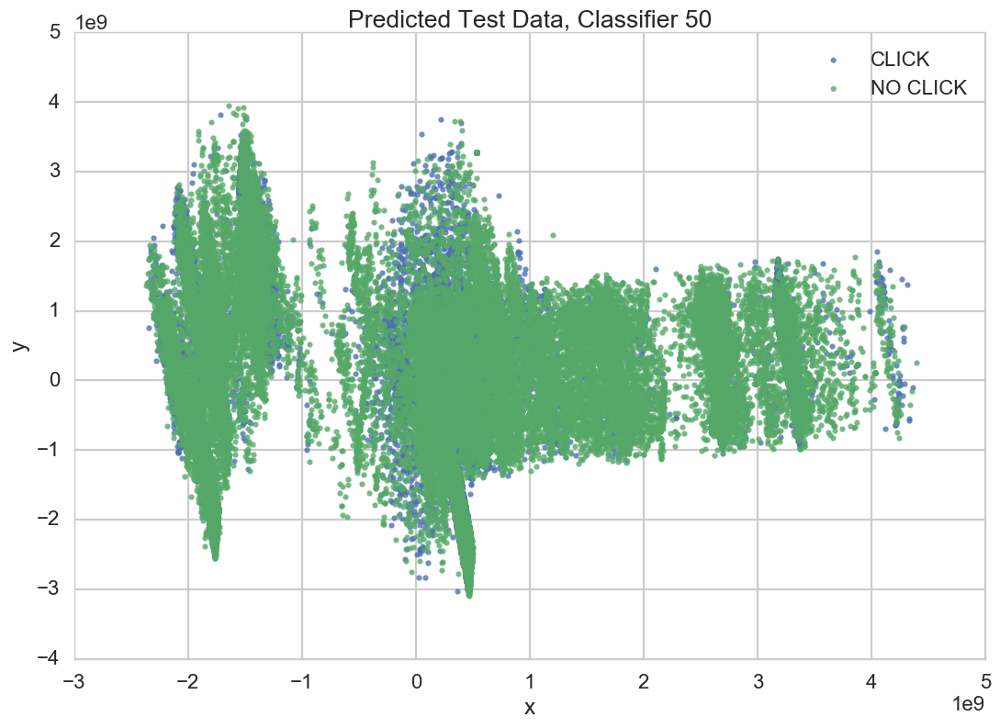

In [100]:
pu.plot_distribution(XTEST, None, clf_rfc_50, predicted=True, title="Predicted Test Data, Classifier 50")

#### Claibration Curve:
The following chart shows that the calibration curve for all the classifiers using 50-50 balanced data-set. As expected Random Forest Classifier trained with 50-50 balanced set has the best probability distribution.

In [57]:
all_clfs = [(clf_lr_50, 'Logistic50'),
            (clf_lr_33, 'Logistic33'),
            #(clf_lr_20, 'Logistic20'),
            (clf_sgd_50, 'SGD50'),
            #(clf_sgd_33, 'SGD, 33-66 Class Ratio'),
            #(clf_sgd_20, 'SGD, 20-80 Class Ratio'),
            (clf_rfc_50, 'RFC50'),
            (clf_rfc_33, 'RFC33'),
            (clf_rfc_20, 'RFC20')]

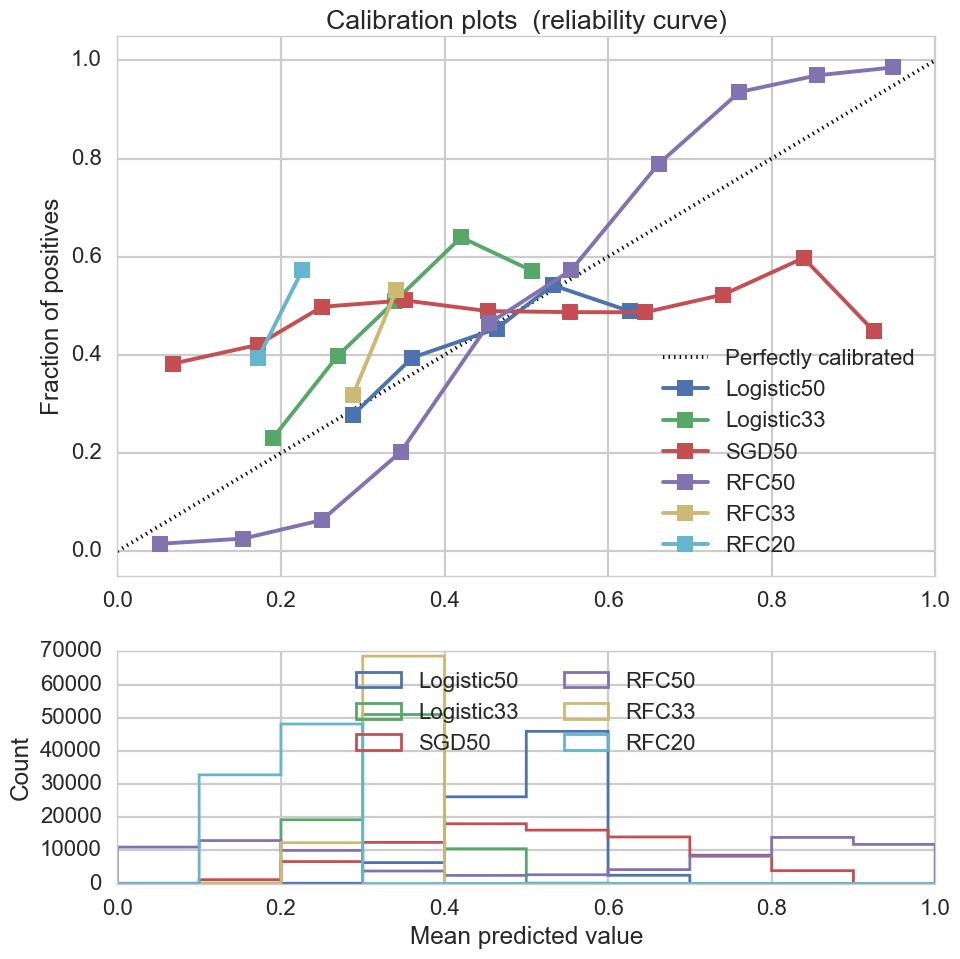

In [60]:
pu.calibration_plot(all_clfs, X50, y50)

##### Calibratin curve of Random Forest Classifier with 50-50 balanced Sample.

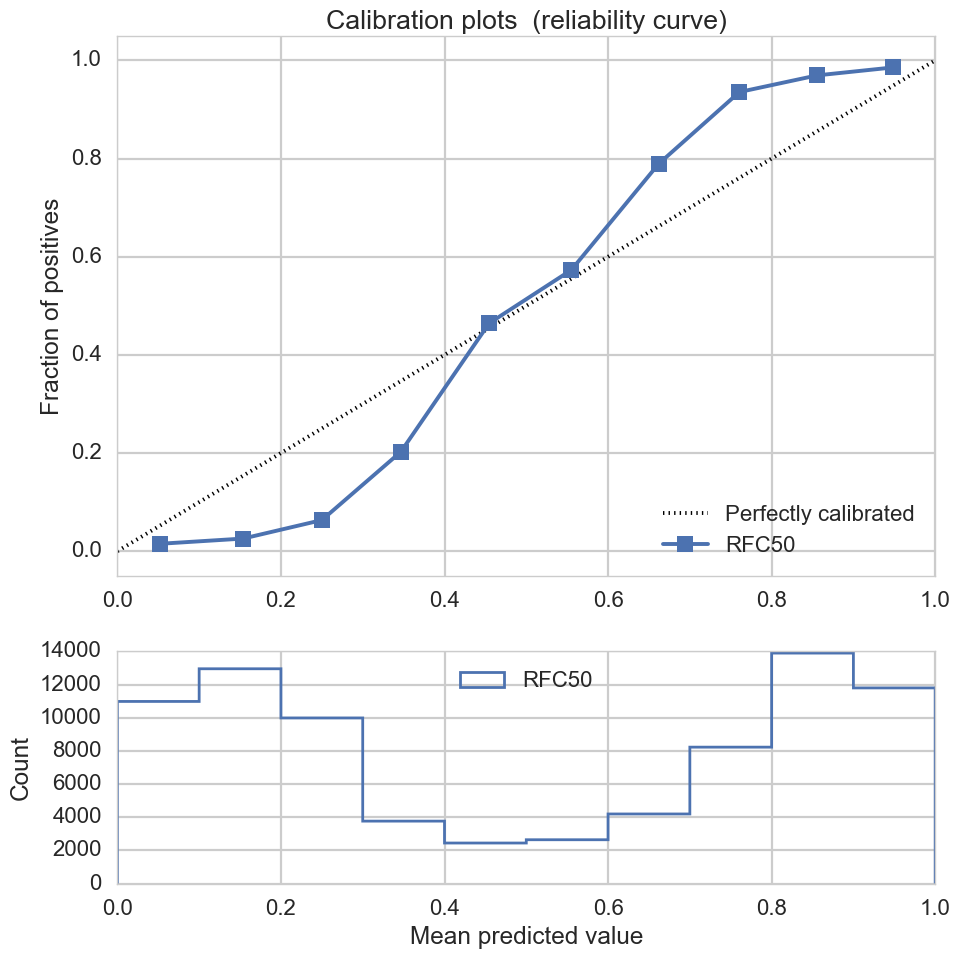

In [102]:
pu.calibration_plot([(clf_rfc_50, 'RFC50')], X50, y50)

##### Calibration Curve of Random Forest Classification with Test Data

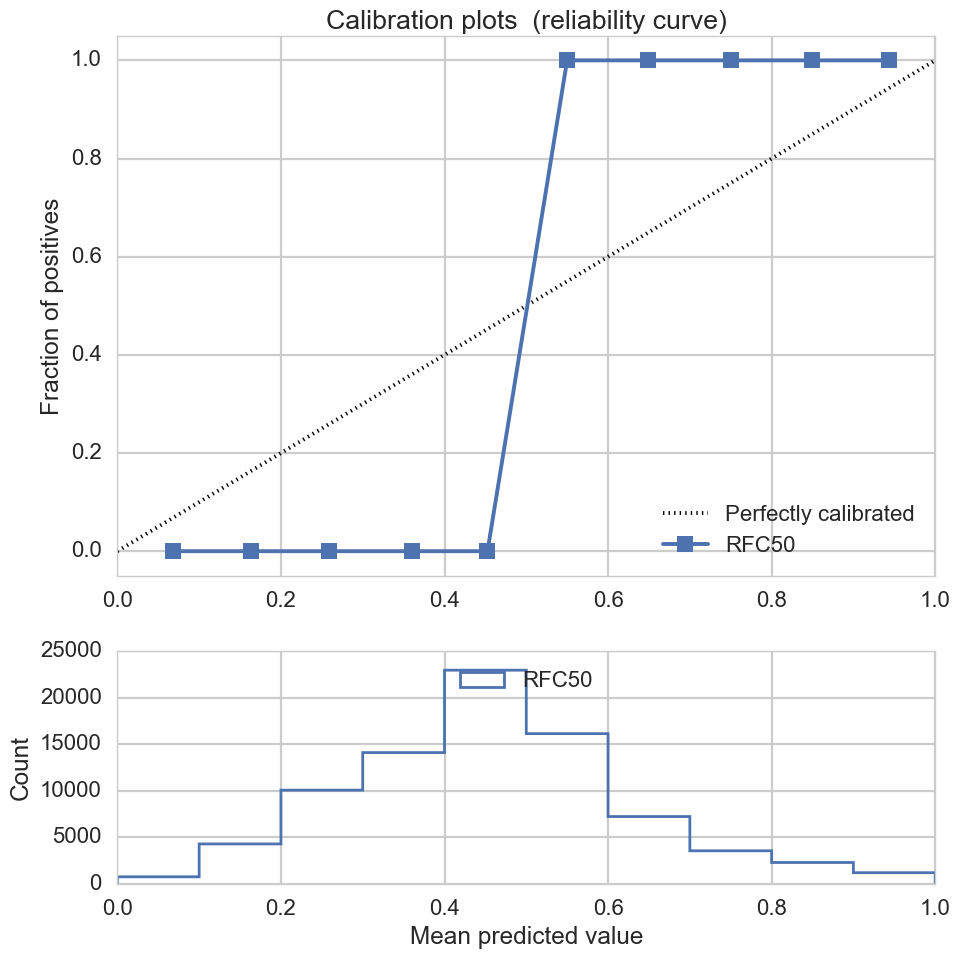

In [103]:
pu.calibration_plot([(clf_rfc_50, 'RFC50')], XTEST, yTEST_50)

### Conclusion:

* Random Forest Classifier (RFC50)trained with 50-50 balanced sample behaves consistently.
* RFC50 classifier has better accuracy around 96% with training set and 63% accuracy with test set.
* When trying with complete diffrent data-set like 33-66 and 20-80 imbalanced data-sets, its accuracy is about 63% - very similar to its accuracy with test set.
* **CTR** for Test Data set is **34.5%**.
* This model has been derived using 0.2% sample.
* The model could be validated with larger data-set on server.

In [41]:
print(clf_rfc_50.n_features_)
print(clf_rfc_50.feature_importances_)

22
[ 0.08274089  0.00345926  0.00713073  0.04241003  0.03814186  0.01263665
  0.02668952  0.01250255  0.0137684   0.03410853  0.26769635  0.18666099
  0.00328918  0.01338757  0.08836996  0.0054575   0.01406948  0.03209708
  0.01152182  0.02404131  0.05340426  0.02641606]
